# 1D Pilot-wave equations: Regular dynamics

# Case: $a, b, \omega_2 = (1, 0, 1)$ 

In [8]:
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import matplotlib.pylab as pl
from scipy.integrate import solve_ivp
from pylds.base import compute_lagrangian_descriptor
from pylds.tools import draw_ld, draw_all_lds, normalise, get_gradient_magnitude, draw_ld_pair

This expressions matches the one in the Overleaf project of the students

In [15]:
def Bohmian_velocity_field(time, u, PARAMETERS=[1,1,1,0]):
    x, y = u.T
    #model parameters
    a, b, omega2, t0 = PARAMETERS
    t = time + t0
    #velocity components
    G = 1 + 2*a*x*np.cos(t) +\
        2*b*np.sqrt(omega2)*x*y*np.cos((1 + omega2)*t) +\
        (a*x)**2 +\
        2*a*b*np.sqrt(omega2)*x**2*y*np.cos(omega2*t) +\
        omega2*(b*x*y)**2
    vx = -(a*np.sin(t) + b*np.sqrt(omega2)*y*np.sin((1 + omega2)*t))/G
    vy = -b*np.sqrt(omega2)*x*(a*x*np.sin(omega2*t) + np.sin((1 + omega2)*t))/G
    
    return np.column_stack([vx, vy])

# Regular dynamics

* WAVE EQUATION: Differences in notation

_Students notation_

\begin{equation}
    \Psi = c_{0,0}\psi_{0,0} + a\:c_{1,0}\psi_{1,0} + b\:c_{1,1}\psi_{1,1}
\end{equation}

Setting $\omega_1=1$ and $\omega_2=\frac{1}{c^2}$ for some $c \in \mathbb{R}$, and setting $c_{0,0}= 1, c_{1,0}= \frac{1}{\sqrt{2}}, c_{1,1}= \frac{1}{2}$.

_Notation followed_

\begin{equation}
    \Psi = \psi_{0,0} + C_{1}\psi_{1,0} + C_{2}\psi_{1,1}
\end{equation}

where $C_1 = \frac{a}{\sqrt{2}}$ and $C_2 = \frac{b}{2}$

* ASSAYS
   * __First__, test the effect on the dynamics revealed by LDs, as we add up excited states to the ground state
   * __Second__, test the effect on the dynamics revealed by LDs, as the dynamics changes from regular to chaotic when the ratio of angular frequencies, $\omega_1 / \omega_2$, changes from rational to irrational. 
   * __Third__, LD convergence with integration time $\tau$

## Description

* Wave function

\begin{equation*}
    \Psi = \psi_{0,0} + \frac{1}{\sqrt{2}}\psi_{1,0}
\end{equation*}

* Bohm equations of motion

\begin{aligned}
    \frac{dx}{dt} &= -\frac{\sin(t)}{1+2x\cos(t)+x^2}\\
    \frac{dy}{dt} &= \; 0
\end{aligned}

* Nodal lines (where $\Psi(x_N, y_N, t_N) = 0$)

\begin{equation*}
(x_N, y_N, t_N) = ((-1)^{k+1}, y, k \pi) \quad y \in \mathbb{R}; k \in \mathbb{Z}
\end{equation*}

## Vector field and trajectories

In [3]:
def f(t, x, a = 1, omega1 = 1):
    f1 = -a*np.sqrt(omega1)*np.sin(omega1*t)
    f2 = 1 + 2*a*np.sqrt(omega1)*x*np.cos(omega1*t) + a**2 * omega1 * x**2
    return f1/f2

In [4]:
%matplotlib inline

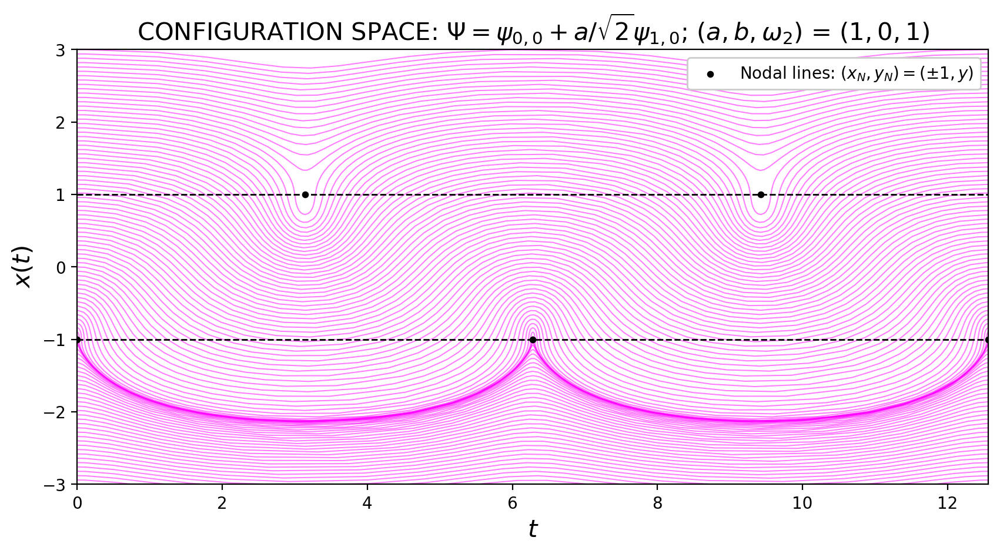

In [157]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

a = 1
#omega1 = 10
omega1 = 1
vector_field = lambda t, x: f(t, x, a, omega1)

t0, tf = [0, 4*np.pi]
time_span = (t0, tf)
color_traj = 'magenta'

TRAJECTORIES = []
N_traj = 101

ICs_interval = [-3, 3]
for x0 in np.linspace(*ICs_interval, N_traj):
    solution = solve_ivp(vector_field, time_span, [x0], rtol=1.0e-12)
    trajectory = solution.y
    TRAJECTORIES.append([solution.t, trajectory[0]])
    ax.plot(solution.t, trajectory[0], c="magenta", lw=0.75, alpha=0.5)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$x(t)$", fontsize=15)


for k in range(5):
    ax.scatter(k*np.pi, a*(-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.set_xlim(0, 4*np.pi)
ax.set_ylim(-3, 3)
title = "CONFIGURATION SPACE: $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title, fontsize=15)

ax.plot(time_span, (a,a), lw=1,linestyle="--", color="black")
ax.plot(time_span, (-a*1,-a*1), lw=1,linestyle="--", color="black")

label = "Nodal lines: $(x_N, y_N) = (\pm 1, y)$"
ax.scatter([],[],color="black", s=10, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
ax.set_aspect(1)
plt.show()

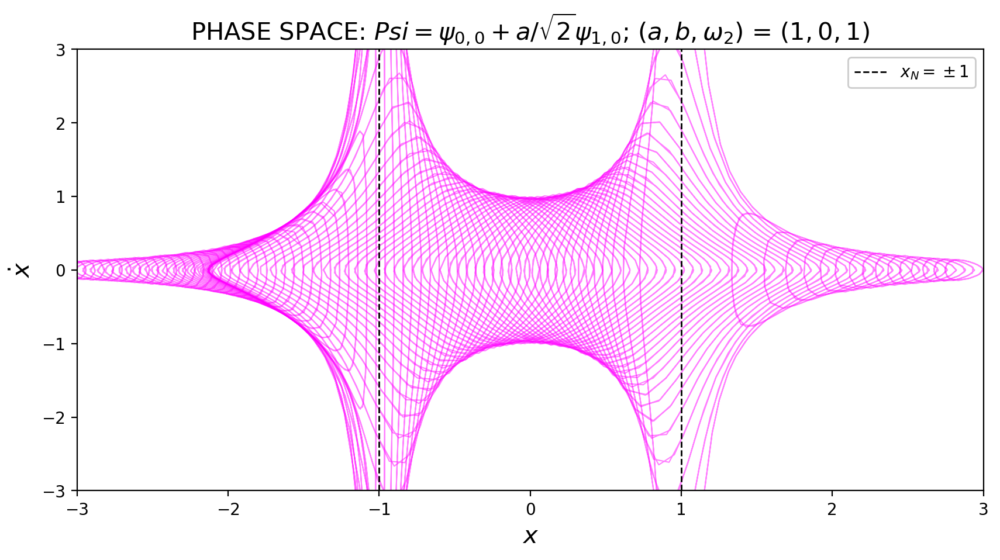

In [7]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
# colors = pl.cm.rainbow(np.linspace(0,1,len(TRAJECTORIES_subset)))

# alphas = np.linspace(0,1,len(TRAJECTORIES))

for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    plt.plot(trajectory[-1], f(*trajectory), c="magenta", lw=0.75, alpha=0.5)
    
#axis labels
ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$\dot{x}$", fontsize=15)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

title = "PHASE SPACE: $Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($1, 0, 1$)"
ax.set_title(title, fontsize=15)

ax.plot((-1,-1), (-3, 3), lw=1,linestyle="--", color="black", zorder=10)
ax.plot(( 1, 1), (-3, 3), lw=1,linestyle="--", color="black", zorder=10)

label = "$x_N = \pm 1$"
ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
plt.show()

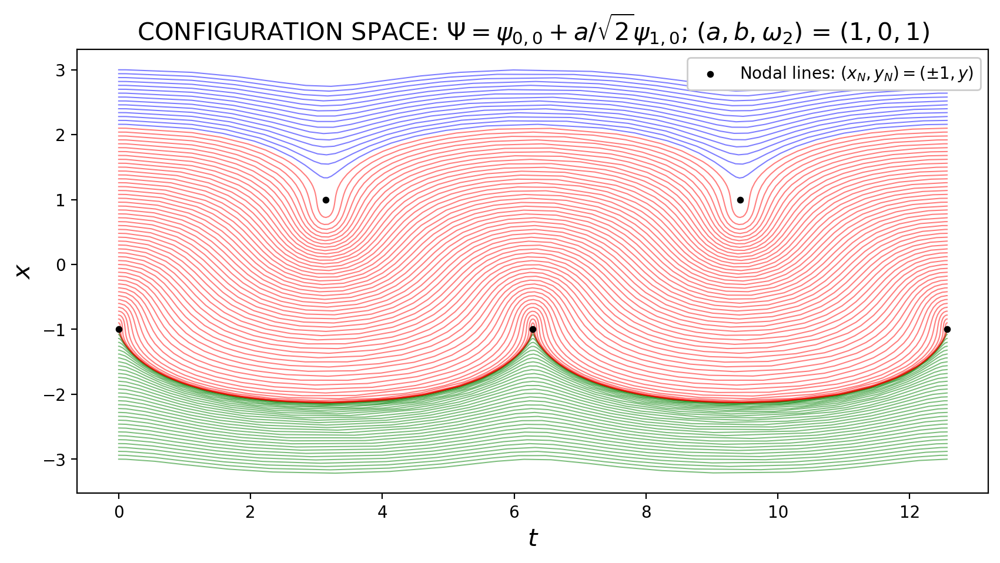

In [8]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

TRAJECTORIES_subset=[]
alpha = 0.5
for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    if -3 <= trajectory[-1][0] < -1: 
        color = "green"
    elif -1 <= trajectory[-1][0] < 2.1: 
        color = "red"
    elif  2.1 <= trajectory[-1][0] < 3: 
        color = "blue"
    plt.plot(*trajectory, c=color, lw=0.75, alpha=alpha)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$x$", fontsize=15)

for k in range(5):
    ax.scatter(k*np.pi, (-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

title = "CONFIGURATION SPACE: $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title, fontsize=15)

# ax.plot(time_span, (a,a), lw=1,linestyle="--", color="black", alpha=0.5, zorder=10)
# ax.plot(time_span, (-a*1,-a*1), lw=1,linestyle="--", color="black", alpha=0.5, zorder=10)

label = "Nodal lines: $(x_N, y_N) = (\pm 1, y)$"
ax.scatter([],[],color="black", s=10, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
# ax.set_xlim(-3, 3)
# ax.set_ylim(-3, 3)

# ax.set_aspect(1)
plt.show()

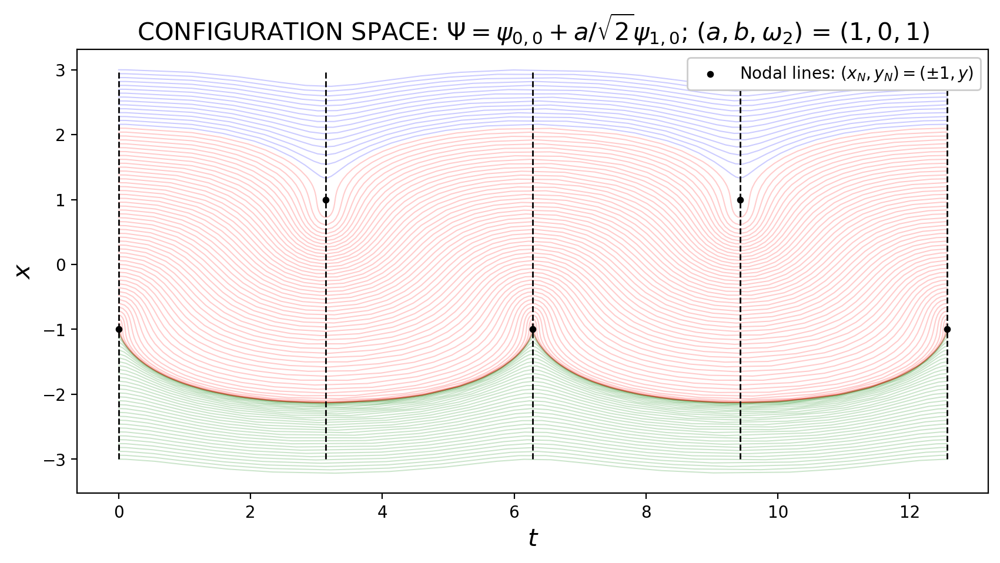

In [9]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

TRAJECTORIES_subset=[]
alpha = 0.2
for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    if -3 <= trajectory[-1][0] < -1: 
        color = "green"
    elif -1 <= trajectory[-1][0] < 2.1: 
        color = "red"
    elif  2.1 <= trajectory[-1][0] < 3: 
        color = "blue"
    plt.plot(*trajectory, c=color, lw=0.75, alpha=alpha)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$x$", fontsize=15)

for k in range(5):
    ax.scatter(k*np.pi, (-1)**(k+1), color="black", s=10, zorder=10, alpha=1)
    ax.plot((k*np.pi, k*np.pi), (-3,3), color="black", lw=1, linestyle="--")
    
title = "CONFIGURATION SPACE: $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title, fontsize=15)

# ax.plot(time_span, (a,a), lw=1,linestyle="--", color="black", alpha=0.5, zorder=10)
# ax.plot(time_span, (-a*1,-a*1), lw=1,linestyle="--", color="black", alpha=0.5, zorder=10)

label = "Nodal lines: $(x_N, y_N) = (\pm 1, y)$"
ax.scatter([],[],color="black", s=10, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
# ax.set_xlim(-3, 3)
# ax.set_ylim(-3, 3)

# ax.set_aspect(1)
plt.show()

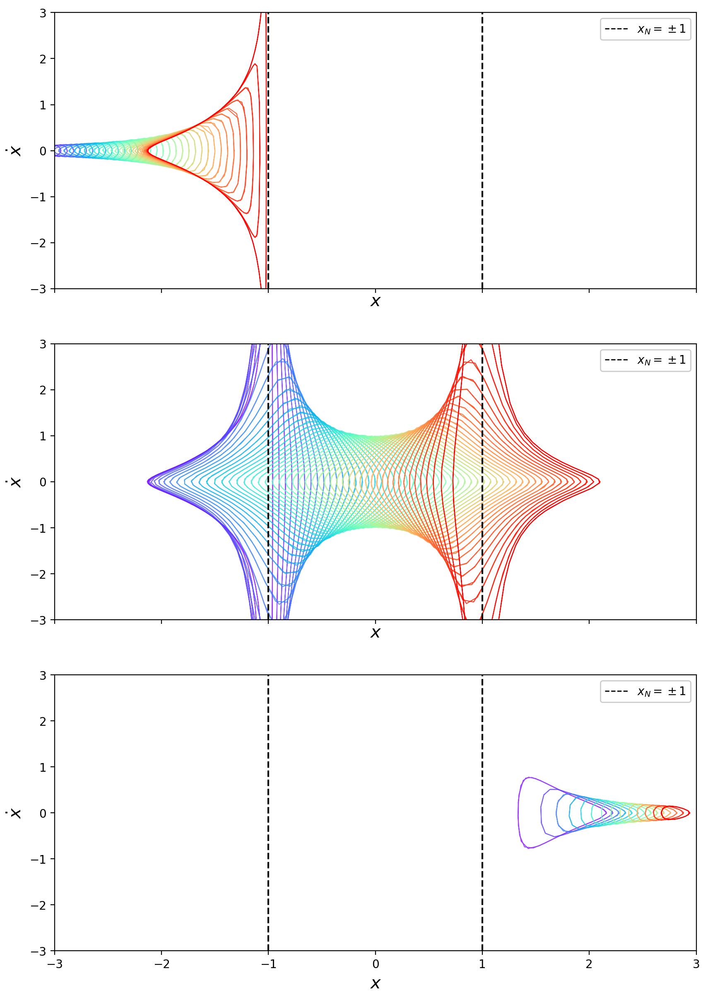

In [10]:
fig,axes = plt.subplots(3,1,figsize=(10,15),dpi=200, sharex=True, sharey=True)

colors = pl.cm.brg(np.linspace(0,1,len(TRAJECTORIES)))    
alpha = 0.5

TRAJECTORIES_green = []
TRAJECTORIES_red = []
TRAJECTORIES_blue = []

for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    if -3 <= trajectory[-1][0] < -1: 
        TRAJECTORIES_green.append(trajectory)
    elif -1 <= trajectory[-1][0] < 2.1: 
        TRAJECTORIES_red.append(trajectory)
    elif  2.1 <= trajectory[-1][0] < 3: 
        TRAJECTORIES_blue.append(trajectory)
    
data = [TRAJECTORIES_green, TRAJECTORIES_red, TRAJECTORIES_blue]
for i in range(3):
    ax = axes[i]
    X = data[i]
    colors = pl.cm.rainbow(np.linspace(0,1,len(X)))
    alphas = np.linspace(0.75,1,len(X))
    for j in range(len(X)):
        trajectory = X[j]
        ax.plot(trajectory[-1], f(*trajectory), color=colors[j], lw=0.75, alpha=alphas[j])
            
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    
    ax.plot((-1,-1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)
    ax.plot(( 1, 1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)

    label = "$x_N = \pm 1$"
    ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

    ax.legend(loc="upper right", facecolor="white", framealpha=1)

    
#axis labels
    ax.set_xlabel("$x$", fontsize=15)
    ax.set_ylabel("$\dot{x}$", fontsize=15)


# ax.set_aspect(1)
plt.show()

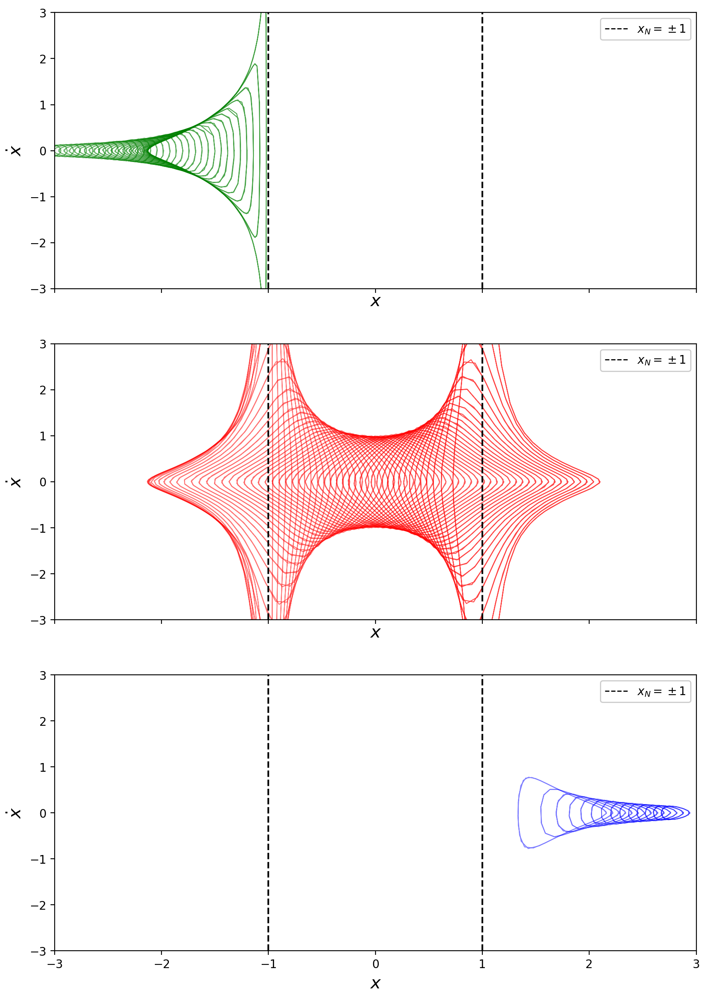

In [11]:
fig,axes = plt.subplots(3,1,figsize=(10,15),dpi=200, sharex=True, sharey=True)

colors = pl.cm.brg(np.linspace(0,1,len(TRAJECTORIES)))    
alpha = 0.5

TRAJECTORIES_green = []
TRAJECTORIES_red = []
TRAJECTORIES_blue = []

for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    if -3 <= trajectory[-1][0] < -1: 
        TRAJECTORIES_green.append(trajectory)
    elif -1 <= trajectory[-1][0] < 2.1: 
        TRAJECTORIES_red.append(trajectory)
        
    elif  2.1 <= trajectory[-1][0] < 3: 
        TRAJECTORIES_blue.append(trajectory)
        
    
data = [TRAJECTORIES_green, TRAJECTORIES_red, TRAJECTORIES_blue]
colors = ["green", "red", "blue"]
for i in range(3):
    ax = axes[i]
    X = data[i]
#     colors = pl.cm.rainbow(np.linspace(0,1,len(X)))
    alphas = np.linspace(0.5,0.75,len(X))
    color=colors[i]
    for j in range(len(X)):
        trajectory = X[j]
        ax.plot(trajectory[-1], f(*trajectory), color=colors[i], lw=0.75, alpha=alphas[j])
            
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    
    ax.plot((-1,-1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)
    ax.plot(( 1, 1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)

    label = "$x_N = \pm 1$"
    ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

    ax.legend(loc="upper right", facecolor="white", framealpha=1)

    
#axis labels
    ax.set_xlabel("$x$", fontsize=15)
    ax.set_ylabel("$\dot{x}$", fontsize=15)


# ax.set_aspect(1)
plt.show()

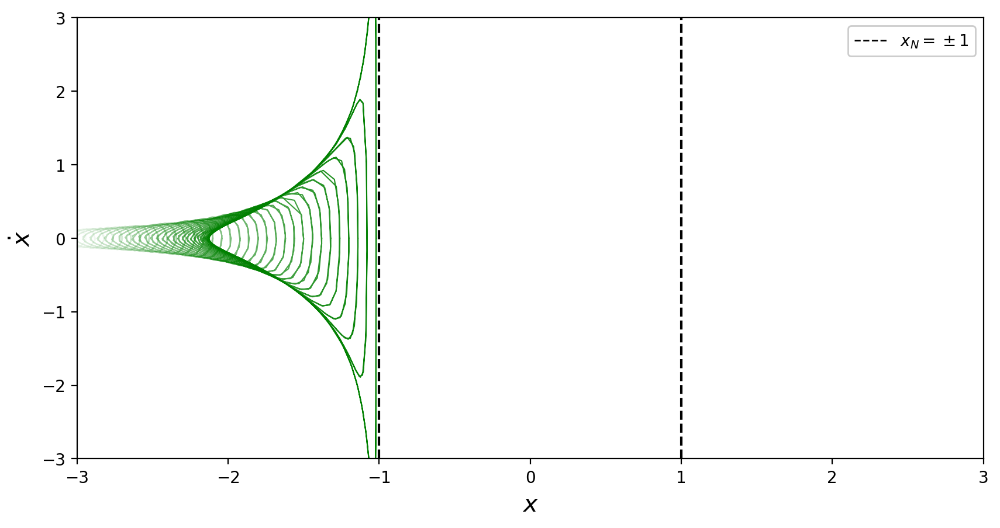

In [12]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
colors = pl.cm.rainbow(np.linspace(0,1,len(TRAJECTORIES_green)))
alphas = np.linspace(0,1,len(TRAJECTORIES_green))

for i in range(len(TRAJECTORIES_green)):
    trajectory = TRAJECTORIES_green[i]
    plt.plot(trajectory[-1], f(*trajectory), c="green", lw=0.75, alpha=alphas[i], zorder=-i*10)
    

# for k in range(5):
#     ax.scatter(k*np.pi, (-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.plot((-1,-1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)
ax.plot(( 1, 1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)

label = "$x_N = \pm 1$"
ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$\dot{x}$", fontsize=15)

# ax.set_aspect(1)
plt.show()

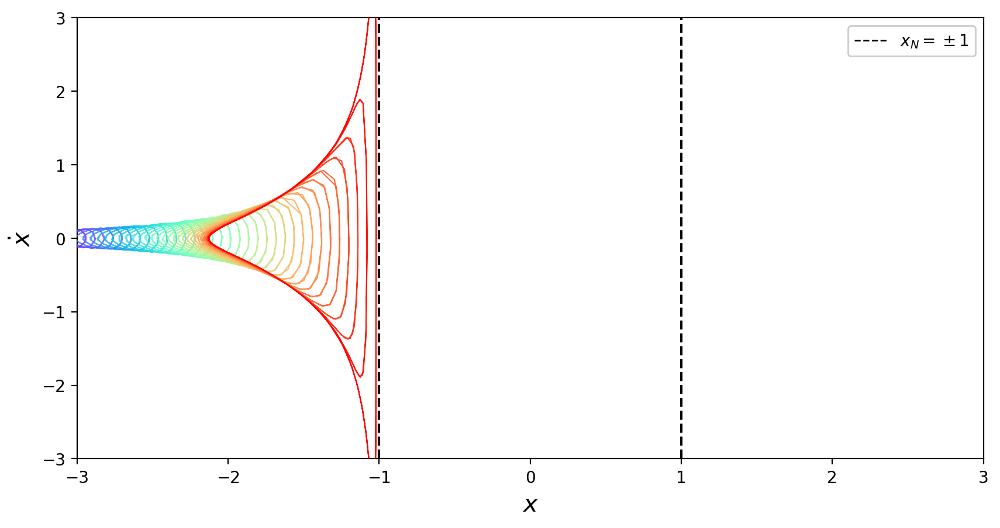

In [13]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
colors = pl.cm.rainbow(np.linspace(0,1,len(TRAJECTORIES_green)))
alphas = np.linspace(0.75,1,len(TRAJECTORIES_green))

for i in range(len(TRAJECTORIES_green)):
    trajectory = TRAJECTORIES_green[i]
    plt.plot(trajectory[-1], f(*trajectory), c=colors[i], lw=0.75, alpha=alphas[i], zorder=i*10)
    

# for k in range(5):
#     ax.scatter(k*np.pi, (-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.plot((-1,-1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)
ax.plot(( 1, 1), (-3, 3), lw=1.5,linestyle="--", color="black", zorder=10)

label = "$x_N = \pm 1$"
ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$\dot{x}$", fontsize=15)

# ax.set_aspect(1)
plt.show()

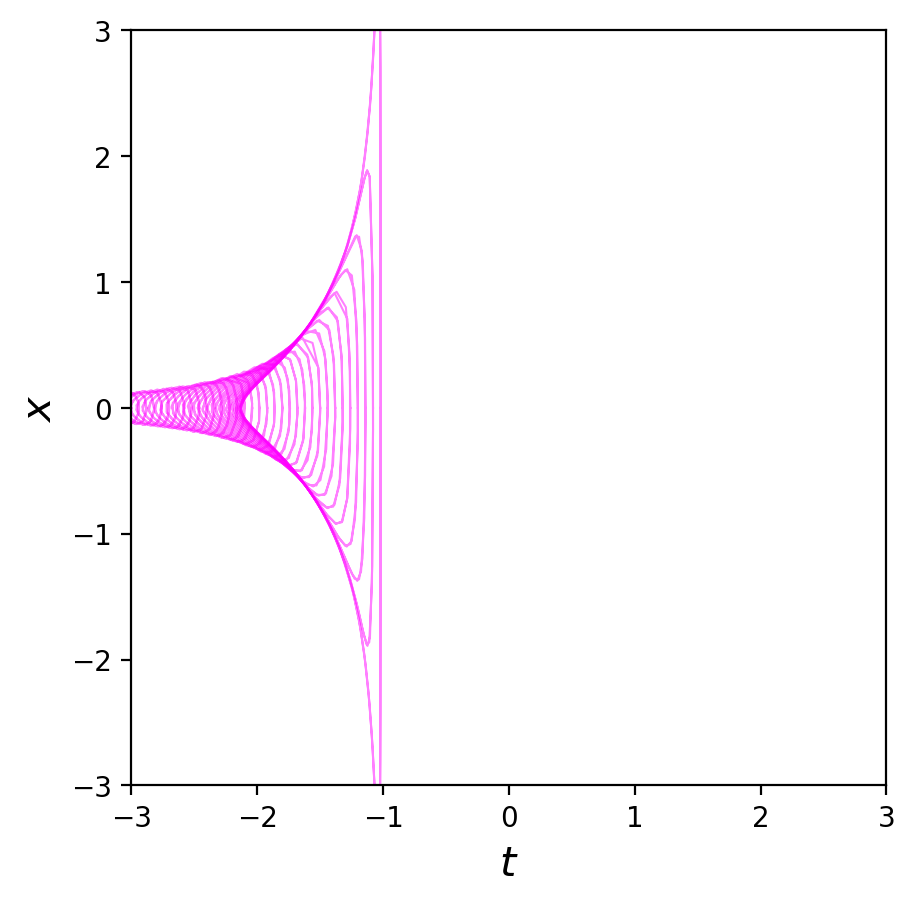

In [14]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

x_min, x_max = (-3, -1)


for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    if x_min <= trajectory[-1][0] < x_max: 
        color = "magenta"
        alpha = 0.5
    else:
        color = "magenta"
        alpha = 0
    plt.plot(trajectory[-1], f(*trajectory), c=color, lw=0.75, alpha=alpha)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$x$", fontsize=15)

# for k in range(5):
#     ax.scatter(k*np.pi, (-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

ax.set_aspect(1)
plt.show()

# Poincare Plot

## Non-segmented data

In [15]:
a, b, omega2, t0 = (1, 0, 1, 0)
vector_field = lambda t, u: Bohmian_velocity_field(t, u, PARAMETERS=[a, b, omega2, t0])

def f(t, u_flat):
    u = u_flat.reshape(-1,2)
    return vector_field(t, u).ravel()

In [16]:
N = 100
# ICs = 12*(np.random.rand(N**2,2) - 0.5)
color_traj = 'blue'

data_points = []
for k in range(10):
    t0, tf = ((2*k)*np.pi,(2*k+1)*np.pi)
    time_span = (t0, tf)
    ICs = 12*(np.random.rand(N**2,2) - 0.5)
    solution = solve_ivp(f, time_span, ICs.ravel(), t_eval=[tf], rtol=1.0e-12)
    trajectory = solution.y
    data_points.append(trajectory)
    
points = np.array(data_points).reshape(-1).reshape(-1,2)

In [17]:
alphas = []

alpha_min = 0.5
alpha_max = 1
x_min = points[:,0].min()
x_max = points[:,0].max()
x_boundary = -2.1

alpha_left  = lambda x: (x - x_min)*(alpha_max - alpha_min)/(x_boundary - x_min) + alpha_min
alpha_right = lambda x: (x - x_max)*(alpha_max - alpha_min)/(x_boundary - x_max) + alpha_min

for i in range(len(points)):
    x0 = points[i][0]
    if x0 < x_boundary: 
        av = alpha_left(x0)
    elif x0 >= x_boundary: 
        av = alpha_right(x0)
    alphas.append(av)
    
alphas = np.asarray(alphas)

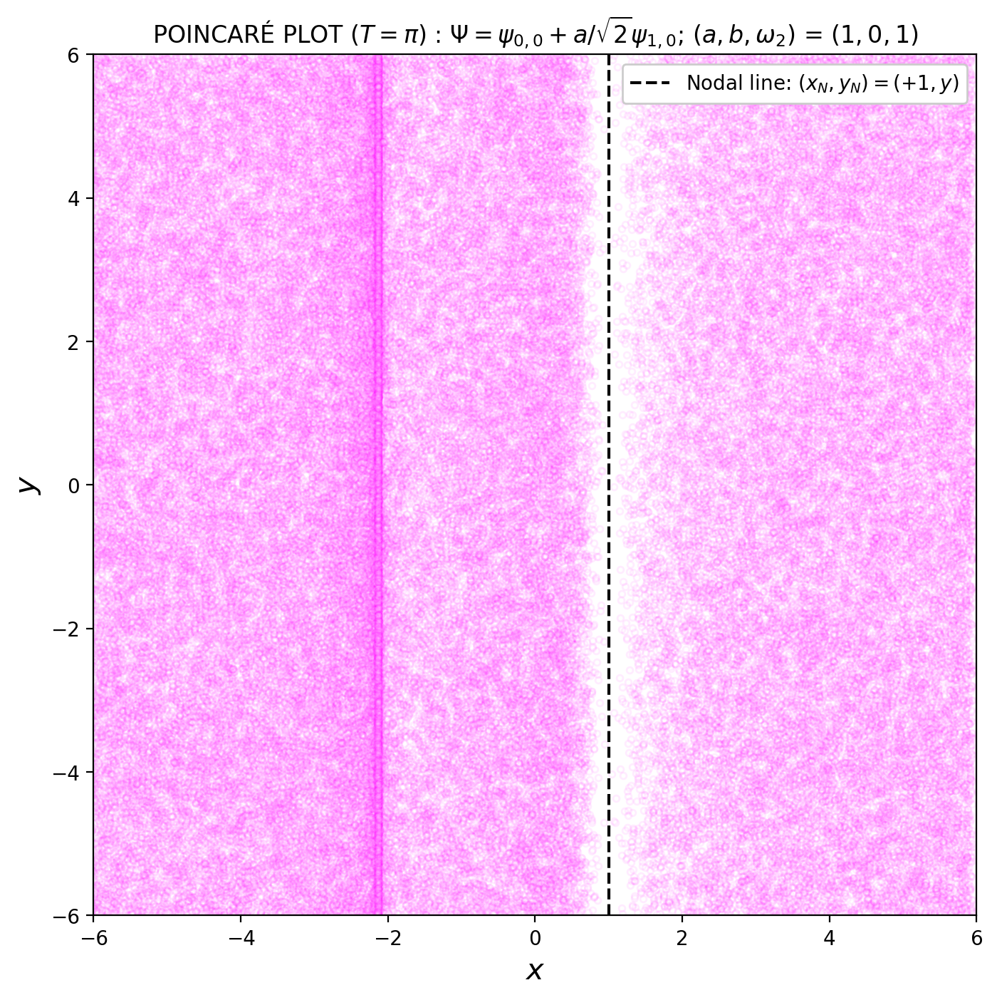

In [18]:
fig, ax = plt.subplots(1,1,figsize=(8,8),dpi=200)

# poincare map points
ax.scatter(*points.T, color="white", marker="o", s=10, alpha=0.075, edgecolor="magenta")

mylabel = "Nodal line: $(x_N, y_N) = (+1, y)$"
ax.plot((1,1),(-6,6), color="black", label=mylabel, linestyle="--", zorder=10)

title = "POINCARÉ PLOT ($T = \pi$) : $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title)

ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$y$", fontsize=15)

ax.set_xlim(-6,6)
ax.set_ylim(-6,6)

ax.legend(loc="upper right", facecolor="white", framealpha=1)

plt.show()

Distribution of states

In [19]:
import pandas as pd
import seaborn as sns

In [20]:
df = pd.DataFrame(data = points)

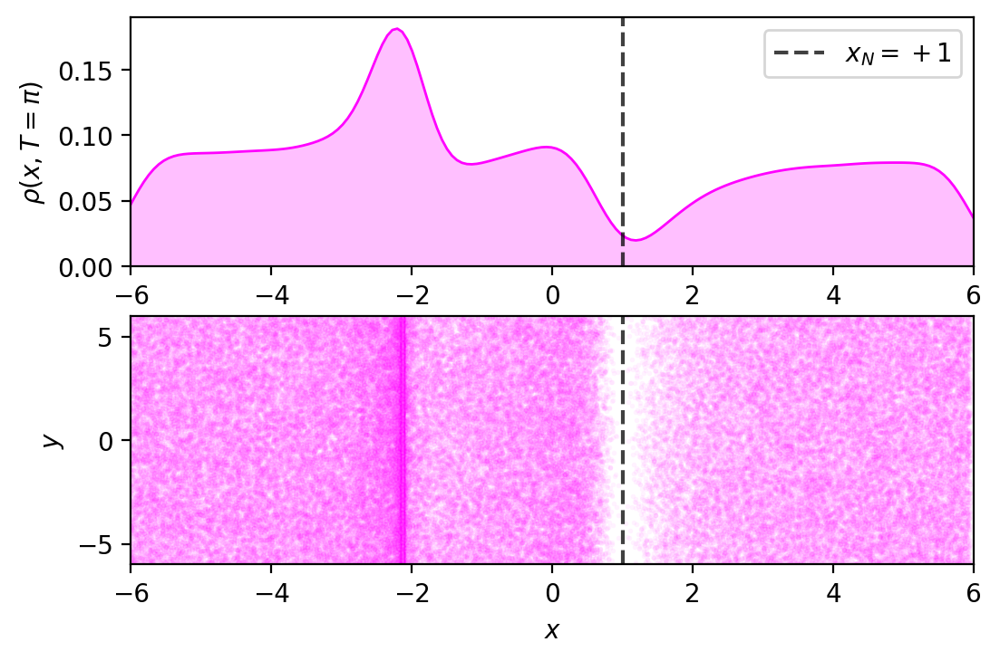

In [21]:
fig,(ax1, ax2) = plt.subplots(2,1,dpi=200)

x_values = df[0].values
sns.kdeplot(x_values, shade=True, color="magenta", ax=ax1)

ax1.plot(( 1, 1),(0,0.19),color="black",linestyle="--",label="$x_N = +1$", alpha=0.75)

ax1.set_ylabel("$\\rho(x, T=\pi)$")
ax1.set_xlabel("$x$")
ax1.set_xlim(-6,6)
ax1.set_ylim(0,0.19)
ax1.legend(loc="upper right")

ax2.scatter(*points.T, color="white", marker="o", s=1, alpha=0.05, edgecolor="magenta")
ax2.plot((1, 1),(-6,6),color="black",linestyle="--", label="$x_N = +1$", alpha=0.75)
ax2.set_xlabel("$x$")
ax2.set_ylabel("$y$")
ax2.set_xlim(-6,6)
ax2.set_ylim(-6,6)
# ax2.legend(loc="upper right")

plt.show()

## Incorporate wave function information

In [48]:
import sympy as sym

x, y = sym.symbols('x y', real=True)

h = sym.Symbol('hbar')
omega1 = sym.Symbol('omega1', real=True)
omega2 = sym.Symbol('omega2', real=True)
n1 = sym.Symbol('n1')
n2 = sym.Symbol('n2')

e = sym.exp
t = sym.Symbol('t', real=True)
c = sym.Symbol('c', real=True)

In [23]:
E_n1n2 = h*( (sym.Rational(1/2) + n1)*omega1 + (sym.Rational(1/2) + n2)*omega2 )
E_n1n2 = E_n1n2.subs(h,1)

In [24]:
def psi_n1n2(n1_val, n2_val):
    C_n1n2_numerator = (omega1*omega2)**(sym.Rational(1/4))
    C_n1n2_divider = sym.sqrt(sym.pi* sym.factorial(n1) * sym.factorial(n2)* 2**(n1+n2))
    C_n1n2 = C_n1n2_numerator/C_n1n2_divider
    H_n1 = sym.hermite_poly(n1_val, sym.sqrt(omega1)*x)
    H_n2 = sym.hermite_poly(n2_val, sym.sqrt(omega2)*y)
    expfunc1 = sym.exp(-sym.I*E_n1n2*t)
    expfunc2 = sym.exp(-sym.Rational(1/2)*(omega1*x**2 + omega2*y**2))
    product = C_n1n2*expfunc1*expfunc2
    psi_n1n2 = product.subs([(n1, n1_val),(n2, n2_val)])*H_n1*H_n2
    return psi_n1n2

In [25]:
c1, c2 = sym.symbols('c1 c2', real=True) # weight constants
N_factor = sym.sqrt(1 + c1**2 + c2**2) # normalization constant

In [26]:
Psi = (1/N_factor)*(psi_n1n2(0,0) + c1*psi_n1n2(1,0) + c2*psi_n1n2(1,1))

Evaluate wave function

In [27]:
a = 1
b = 0

substitutions = [
    (c1, a/sym.sqrt(2)),
    (c2, b/2),
    (omega1, 1),
    (omega2, 1)
]

In [43]:
Psi = Psi.subs(substitutions)
Psi

sqrt(6)*(x*exp(-2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))/3

In [44]:
Psi

sqrt(6)*(x*exp(-2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))/3

In [49]:
P_Psi = lambda t0,x0,y0: abs(complex(Psi.evalf(subs={t:t0, x:x0, y:y0})))

In [54]:
t0 = 0
x_axis = np.linspace(-6,6,100)
data = [P_Psi(0, x0, 0) for x0 in x_axis]

100000

<AxesSubplot:ylabel='Density'>

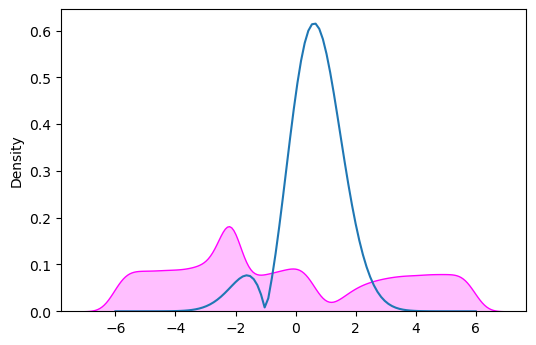

In [56]:
fig,ax = plt.subplots(1,1,dpi=100)
ax.plot(x_axis, data)
sns.kdeplot(x_values, shade=True, color="magenta", ax=ax)

## Segmented data

In [52]:
# poincare map points
points = np.array(data_points).reshape(-1).reshape(-1,2)

In [53]:
colors = []

alpha = 0.5
for i in range(len(points)):
    x0 = points[i][0]
    if x0 < -2.1: 
        c = "green"
    elif -2.1 <= x0 < 1: 
        c = "red"
    elif  x0 >=1: 
        c = "blue"
    colors.append(c)

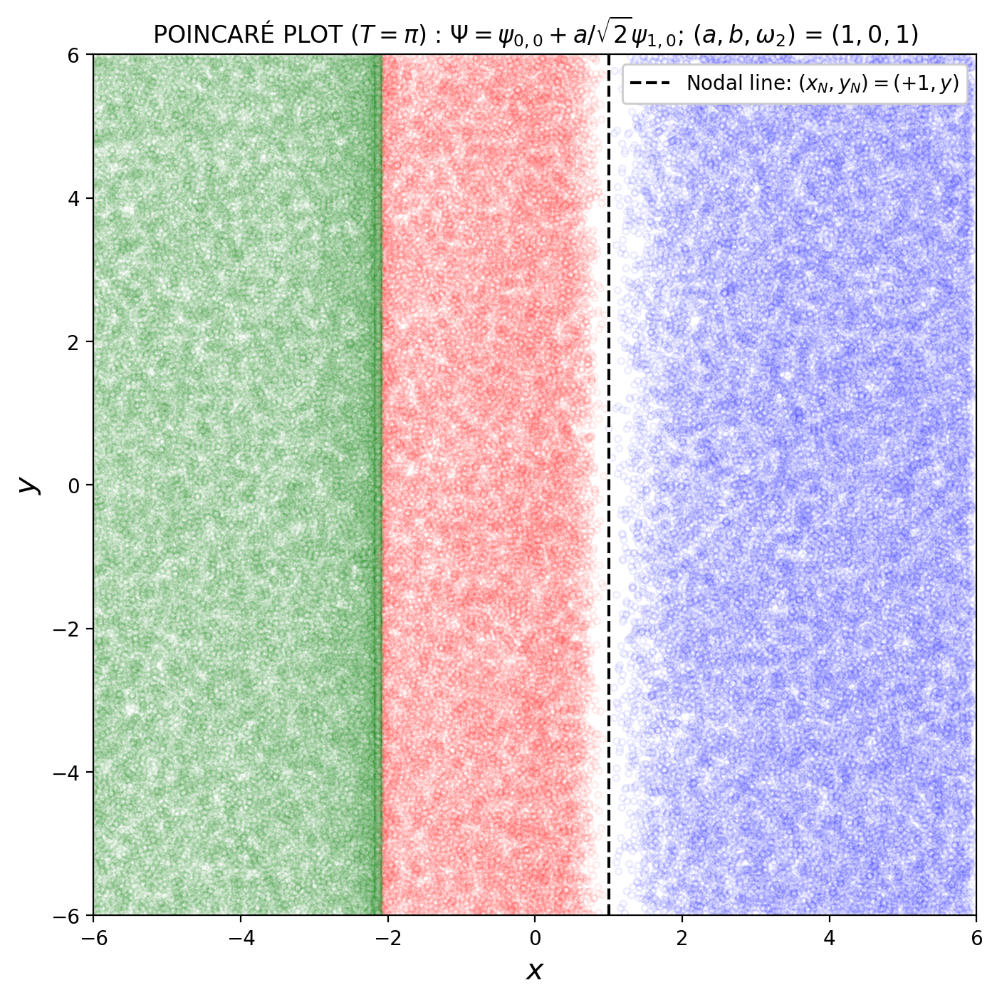

In [55]:
fig,ax = plt.subplots(1,1,figsize=(8,8),dpi=200)


ax.scatter(*points.T, color="white", marker="o", s=10, alpha=0.075, edgecolor=colors)

mylabel = "Nodal line: $(x_N, y_N) = (+1, y)$"
ax.plot((1,1),(-6,6), color="black", label=mylabel, linestyle="--", alpha=1, zorder=10)

title = "POINCARÉ PLOT ($T = \pi$) : $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title)

ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$y$", fontsize=15)

ax.set_xlim(-6,6)
ax.set_ylim(-6,6)

ax.legend(loc="upper right", facecolor="white", framealpha=1)


plt.show()

# Dynamic boundary 

# Compute quantum probability density

## Set up basic variables

In [190]:
import sympy as sym

x, y = sym.symbols('x y', real=True)

h = sym.Symbol('hbar')
omega1 = sym.Symbol('omega1', real=True)
omega2 = sym.Symbol('omega2', real=True)
n1 = sym.Symbol('n1')
n2 = sym.Symbol('n2')

e = sym.exp
t = sym.Symbol('t', real=True)
c = sym.Symbol('c', real=True)

## Energy function

In [191]:
E_n1n2 = h*( (sym.Rational(1/2) + n1)*omega1 + (sym.Rational(1/2) + n2)*omega2 )
E_n1n2

hbar*(omega1*(n1 + 1/2) + omega2*(n2 + 1/2))

In [192]:
E_n1n2 = E_n1n2.subs(h,1)
E_n1n2

omega1*(n1 + 1/2) + omega2*(n2 + 1/2)

## General eigenfunctions

In [193]:
def psi_n1n2(n1_val, n2_val):
    C_n1n2_numerator = (omega1*omega2)**(sym.Rational(1/4))
    C_n1n2_divider = sym.sqrt(sym.pi* sym.factorial(n1) * sym.factorial(n2)* 2**(n1+n2))
    C_n1n2 = C_n1n2_numerator/C_n1n2_divider
    H_n1 = sym.hermite_poly(n1_val, sym.sqrt(omega1)*x)
    H_n2 = sym.hermite_poly(n2_val, sym.sqrt(omega2)*y)
    expfunc1 = sym.exp(-sym.I*E_n1n2*t)
    expfunc2 = sym.exp(-sym.Rational(1/2)*(omega1*x**2 + omega2*y**2))
    product = C_n1n2*expfunc1*expfunc2
    psi_n1n2 = product.subs([(n1, n1_val),(n2, n2_val)])*H_n1*H_n2
    return psi_n1n2

## Total wave function

$\Psi_{norm}(x,y,t) = [\psi_{0,0} + c_1 \psi_{1,0} + c_2 \psi_{1,1}] \frac{1}{N}$

In [194]:
c1, c2 = sym.symbols('c1 c2', real=True) # weight constants
N_factor = sym.sqrt(1 + c1**2 + c2**2) # normalization constant

In [195]:
Psi = (1/N_factor)*(psi_n1n2(0,0) + c1*psi_n1n2(1,0) + c2*psi_n1n2(1,1))
# Psi = psi_n1n2(0,0) + c1*psi_n1n2(1,0) + c2*psi_n1n2(1,1)
Psi

(sqrt(2)*c1*sqrt(omega1)*x*(omega1*omega2)**(1/4)*exp(-I*t*(3*omega1/2 + omega2/2))*exp(-omega1*x**2/2 - omega2*y**2/2)/sqrt(pi) + 2*c2*sqrt(omega1)*sqrt(omega2)*x*y*(omega1*omega2)**(1/4)*exp(-I*t*(3*omega1/2 + 3*omega2/2))*exp(-omega1*x**2/2 - omega2*y**2/2)/sqrt(pi) + (omega1*omega2)**(1/4)*exp(-I*t*(omega1/2 + omega2/2))*exp(-omega1*x**2/2 - omega2*y**2/2)/sqrt(pi))/sqrt(c1**2 + c2**2 + 1)

## Evaluate wave function

\begin{align}
    C_1 &= \frac{a}{\sqrt{2}}\\
    C_2 &= \frac{b}{2}\\
    \omega_1 &= 1\\
    \omega_2 &= 1
\end{align}

In [196]:
a = 1
b = 0

substitutions = [
    (c1, a/sym.sqrt(2)),
    (c2, b/2),
    (omega1, 1),
    (omega2, 1)
]

In [197]:
wave_function = Psi.subs(substitutions)
wave_function

sqrt(6)*(x*exp(-2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))/3

## Quantum probability density function

$\rho(x, y, t) = $

In [198]:
pdf_xy = wave_function*wave_function.conjugate()
pdf_xy

2*(x*exp(-2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))*(x*exp(2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))/3

## Verify normalization

In [199]:
pdf_x = sym.integrate(pdf_xy, (y, -sym.oo, sym.oo))
pdf_x

2*x**2*exp(-x**2)/(3*sqrt(pi)) + 2*x*exp(-x**2)*exp(I*t)/(3*sqrt(pi)) + 2*x*exp(-x**2)*exp(-I*t)/(3*sqrt(pi)) + 2*exp(-x**2)/(3*sqrt(pi))

In [200]:
pdf_integral = sym.integrate(pdf_x, (x, -sym.oo, sym.oo))
pdf_integral

1

## PDF profile at time $t = T$

$\rho_T(x, y) = \vert \Psi_{norm}(x, y, T)\vert^2 = $

In [202]:
# T = sym.pi # pi
T = 0
pdf_xy_T = pdf_xy.subs([(t, T)])
pdf_xy_T

2*(x*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-x**2/2 - y**2/2)/sqrt(pi))**2/3

Integrate over y

$\rho(x) = \int_{-\infty}^{+\infty} \vert \Psi_{norm}(x, y, T)\vert^2 dy= $

In [203]:
pdf_x_T = sym.integrate(pdf_xy_T, (y, -sym.oo, sym.oo))
pdf_x_T

2*x**2*exp(-x**2)/(3*sqrt(pi)) + 4*x*exp(-x**2)/(3*sqrt(pi)) + 2*exp(-x**2)/(3*sqrt(pi))

In [204]:
pdf_y_T = sym.integrate(pdf_xy_T, (x, -sym.oo, sym.oo))
pdf_y_T

exp(-y**2)/sqrt(pi)

## Evaluate the PDF

In [16]:
# evaluate PDF(x)
f = lambda x0: float(pdf_x_T.evalf(subs={x:x0}))

X = np.linspace(-3,3,100)
Y = [f(x) for x in X]

Plot

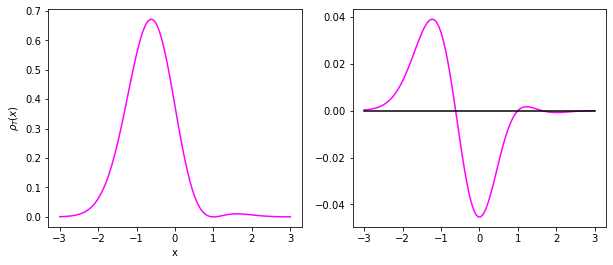

In [17]:
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(10,4))

ax1.plot(X, Y, color="magenta")
ax2.plot(X, np.gradient(Y), color="magenta")

ax2.plot((-3,3),(0,0),color="black")

ax1.set_xlabel("x")
ax1.set_ylabel("$\\rho_T(x)$")

plt.show()

In [18]:
pdf_x_t = lambda x, t: (2/(3*np.pi))*np.exp(-x**2)*(x**2 + 2*x*np.cos(t) + 1)

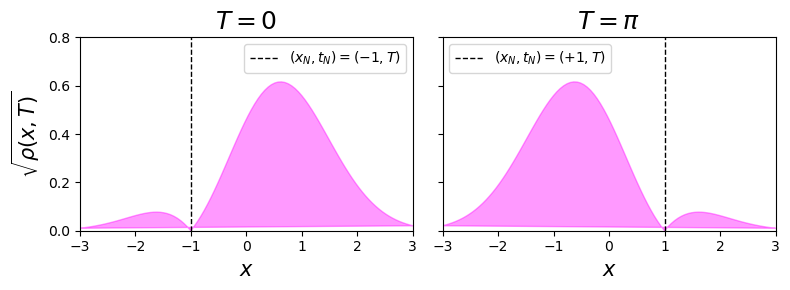

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,3), sharex=True, sharey=True, dpi=100)

y_min, y_max = (0.0, 0.8)

###############################################
T = 0
Y = [np.sqrt(pdf_x_t(x, T)) for x in X]

ax1.fill(X, Y, color="magenta",alpha=0.4)
ax1.plot((-1,-1),(y_min, y_max),color="black",lw=1,linestyle="--", label="$(x_N, t_N) = (-1, T)$")

ax1.set_title("$T = 0$", fontsize=18)
###############################################
T = np.pi
Y = [np.sqrt(pdf_x_t(x, T)) for x in X]

ax2.fill(X, Y, color="magenta",alpha=0.4)
ax2.plot((1,1),(y_min, y_max),color="black",lw=1,linestyle="--", label="$(x_N, t_N) = (+1, T)$")

ax2.set_title("$T = \pi$", fontsize=18)
###############################################
ax1.set_xlim(-3,3)
ax1.set_ylim(y_min, y_max)

ax1.set_xlabel("$x$", fontsize=15)
ax2.set_xlabel("$x$", fontsize=15)
ax1.set_ylabel("$\sqrt{\\rho(x, T)}$", fontsize=15)

ax1.legend()
ax2.legend()

fig.tight_layout()

plt.show()

## Animation 

In [20]:
%matplotlib notebook

<IPython.core.display.Javascript object>


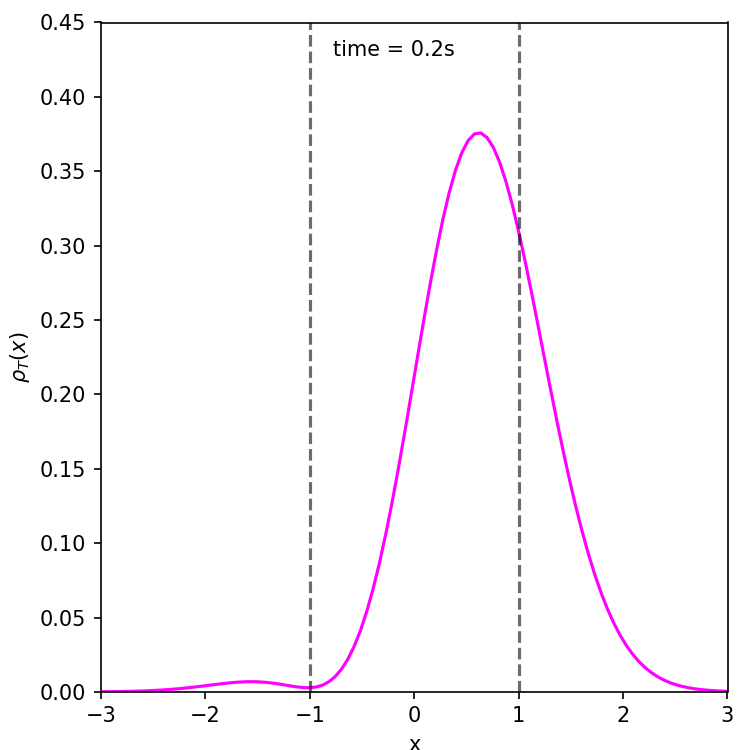

In [21]:
import matplotlib.animation as animation

fig, ax = plt.subplots(1,1,figsize=(5,5))

X = np.linspace(-3,3,100)
t_axis = np.linspace(0, 2*np.pi, 100)

xdata, ydata = [], []

myplot, = ax.plot([],[],'magenta')

time_template = 'time = %.1fs'
time_text = ax.text(0.37, 0.95, '', transform=ax.transAxes)

def init():
    ax.set_xlabel("x")
    ax.set_ylabel("$\\rho_T(x)$")
    ax.set_xlim(-3,3)
    ax.set_ylim(0,0.45)
    ax.plot((-1,-1),(0,0.45),color="black",linestyle="--", alpha=0.35)
    ax.plot(( 1, 1),(0,0.45),color="black",linestyle="--", alpha=0.35)
    return myplot,
    
def update(i):
    t = t_axis[i]
    # clear previous data
    xdata, ydata = [], []
    
    # update curve data
    xdata.append(X)
    ydata.append(pdf_x_t(X, t))
    
    myplot.set_data(xdata, ydata)
    
    time_text.set_text(time_template % t)
    
    return myplot, time_text

anim = animation.FuncAnimation(fig, update, 100, interval=50, init_func=init, blit=True)
# anim.save('animation.gif', writer='imagemagick', fps=50, dpi=200)
fig.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


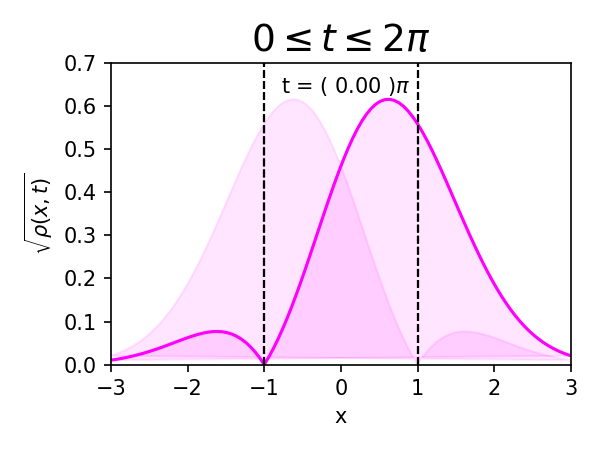

In [24]:
import matplotlib.animation as animation

y_min, y_max = (0.0, 0.8)
fig, ax = plt.subplots(1,1,figsize=(4,3),dpi=100)

X = np.linspace(-3,3,100)
t_axis = np.linspace(0, 2, 100)

#####################################
T = 0
Y = [np.sqrt(pdf_x_t(x, T)) for x in X]
ax.fill(X, Y, color="magenta",alpha=0.1)

T = np.pi
Y = [np.sqrt(pdf_x_t(x, T)) for x in X]
ax.fill(X, Y, color="magenta",alpha=0.1)

#####################################

xdata, ydata = [], []

myplot, = ax.plot([],[],'magenta')

time_template = 't = ( %.2f )$\pi$'
time_text = ax.text(0.37, 0.9, '', transform=ax.transAxes)

def init():
    ax.set_title("$0 \leq t \leq 2\pi$", fontsize=18)
    ax.set_xlabel("x")
    ax.set_ylabel("$\sqrt{\\rho(x, t)}$")
    ax.set_xlim(-3,3)
    ax.set_ylim(0,0.7)
    ax.plot((-1,-1),(y_min,y_max),color="black",linestyle="--",lw=1)
    ax.plot(( 1, 1),(y_min,y_max),color="black",linestyle="--",lw=1)
    fig.tight_layout()
    return myplot,
    
def update(i):
    t = t_axis[i]
    # clear previous data
    xdata, ydata = [], []
    
    # update curve data
    xdata.append(X)
    y = np.sqrt(pdf_x_t(X, t*np.pi))
    ydata.append(y)
    
    myplot.set_data(xdata, ydata)
    
    time_text.set_text(time_template % t)
    
    return myplot, time_text

anim = animation.FuncAnimation(fig, update, 100, interval=50, init_func=init, blit=True)
anim.save('animation.gif', writer='imagemagick', fps=40, dpi=200)

plt.show()

# PSE visualization

## Wave function defintion

Set up variables

In [1]:
import sympy as sym

x, y = sym.symbols('x y', real=True)

h = sym.Symbol('hbar')
omega1 = sym.Symbol('omega1', real=True)
omega2 = sym.Symbol('omega2', real=True)
n1 = sym.Symbol('n1')
n2 = sym.Symbol('n2')

e = sym.exp
t = sym.Symbol('t', real=True)
c = sym.Symbol('c', real=True)

Energy 

In [2]:
E_n1n2 = h*( (sym.Rational(1/2) + n1)*omega1 + (sym.Rational(1/2) + n2)*omega2 )
E_n1n2 = E_n1n2.subs(h,1)
E_n1n2

omega1*(n1 + 1/2) + omega2*(n2 + 1/2)

General eigenfunctions

In [3]:
def psi_n1n2(n1_val, n2_val):
    C_n1n2_numerator = (omega1*omega2)**(sym.Rational(1/4))
    C_n1n2_divider = sym.sqrt(sym.pi* sym.factorial(n1) * sym.factorial(n2)* 2**(n1+n2))
    C_n1n2 = C_n1n2_numerator/C_n1n2_divider
    H_n1 = sym.hermite_poly(n1_val, sym.sqrt(omega1)*x)
    H_n2 = sym.hermite_poly(n2_val, sym.sqrt(omega2)*y)
    expfunc1 = sym.exp(-sym.I*E_n1n2*t)
    expfunc2 = sym.exp(-sym.Rational(1/2)*(omega1*x**2 + omega2*y**2))
    product = C_n1n2*expfunc1*expfunc2
    psi_n1n2 = product.subs([(n1, n1_val),(n2, n2_val)])*H_n1*H_n2
    return psi_n1n2

Total wave function

$\Psi_{norm}(x,y,t) = [\psi_{0,0} + c_1 \psi_{1,0} + c_2 \psi_{1,1}] \frac{1}{N}$

In [225]:
c1, c2 = sym.symbols('c1 c2', real=True) # weight constants
N_factor = sym.sqrt(1 + c1**2 + c2**2) # normalization constant

In [226]:
Psi = (1/N_factor)*(psi_n1n2(0,0) + c1*psi_n1n2(1,0) + c2*psi_n1n2(1,1))

Evaluate wave function

In [227]:
a = 1
b = 0

substitutions = [
    (c1, a/sym.sqrt(2)),
    (c2, b/2),
    (omega1, 1),
    (omega2, 1)
]

In [228]:
Psi = Psi.subs(substitutions)
Psi

sqrt(6)*(x*exp(-2*I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi) + exp(-I*t)*exp(-x**2/2 - y**2/2)/sqrt(pi))/3

In [210]:
R_evaluator = lambda t0,x0,y0: abs(complex(Psi.evalf(subs={t:t0, x:x0, y:y0})))

In [211]:
def R_wave_function(t, u, f=R_evaluator):
    return np.array([f(t,*u0) for u0 in u])

## Quantum potential

In [212]:
import numpy as np
from scipy.ndimage import laplace

In [213]:
def quantum_potential(t, u):
    R = R_wave_function(t, u)
    R_laplacian = laplace(R)
    U = 0.5*(R_laplacian/R)
    return U

## Classic potential

In [214]:
def classic_potential(t, u, PARAMETERS=(1, 1)):
    x, y = u.T
    omega1, omega2 = PARAMETERS
    V = 0.5*(omega1*x**2 + omega2*y**2)
    return V

## Total potential

In [215]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np
%matplotlib notebook

In [216]:
V = classic_potential
Q = quantum_potential

In [217]:
x_axis = np.linspace(-3,3,300)
y_axis = np.linspace(-3,3,300)
X, Y = np.meshgrid(x_axis, y_axis)
u = np.column_stack([X.ravel(), Y.ravel()])

In [218]:
t0 = np.pi-0.1
R = R_wave_function(t0, u)
Z = R
# potential = Q(t0, u)
Z = Z.reshape(300,300)

<IPython.core.display.Javascript object>


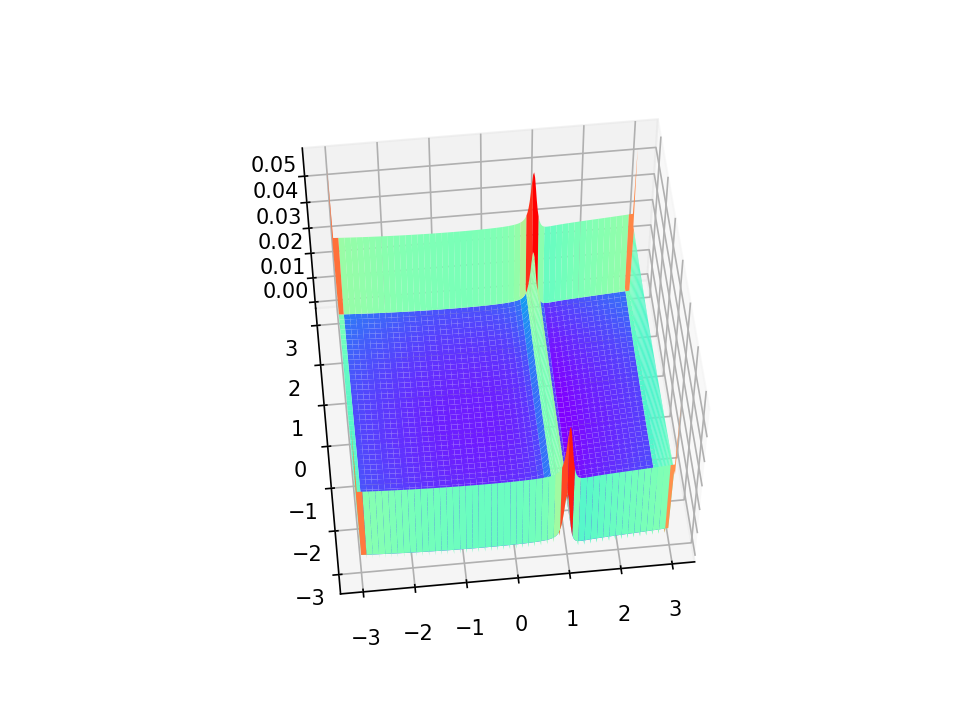

<IPython.core.display.Javascript object>


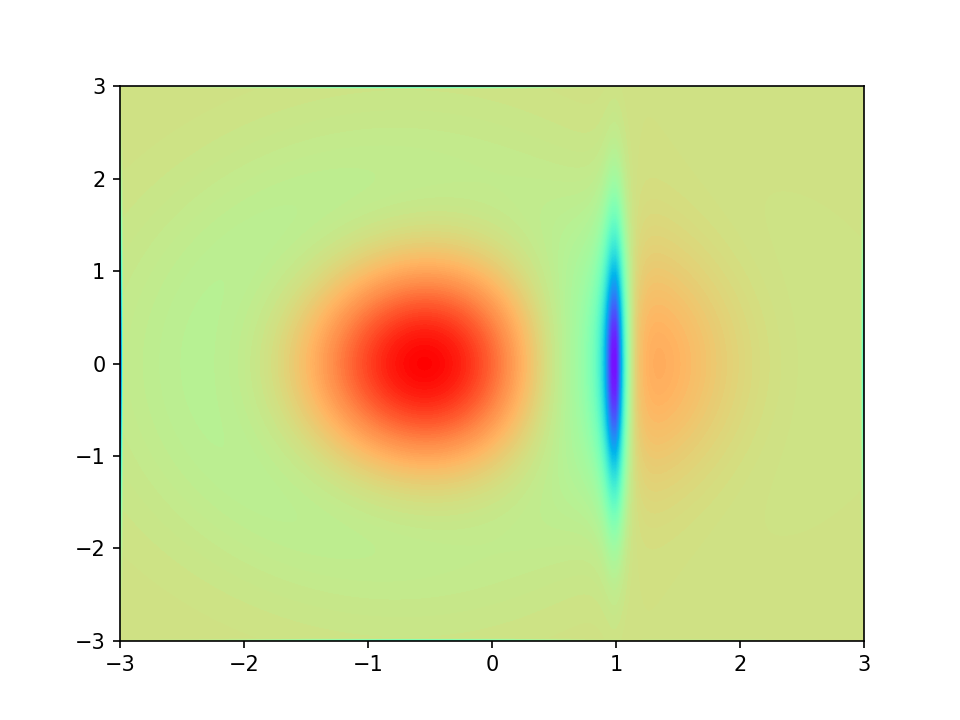

In [224]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"},dpi=100)
surf = ax.plot_surface(X, Y, 0.5*laplace(Z)/Z, cmap="rainbow")

fig, ax = plt.subplots(1,1,dpi=100)
ax.contourf(X,Y,laplace(Z),200,cmap="rainbow_r")

#ax.set_xlabel("$x$")
#ax.set_ylabel("$y$")
# ax.set_zlabel("$z$")

plt.show()

In [109]:
R_2 = (Psi.conjugate()*Psi).simplify()

In [112]:
R_2.simplify()

2*(x**2*exp(I*t) + x*exp(2*I*t) + x + exp(I*t))*exp(-I*t - x**2 - y**2)/(3*pi)

## TEST

In [18]:
import sympy as sym

x, y = sym.symbols('x y', real=True)
e = sym.exp
t = sym.Symbol('t', real=True)

In [19]:
P = (x**2+2*x*sym.cos(t) + 1)*sym.exp(-(x**2 + y**2))
P

(x**2 + 2*x*cos(t) + 1)*exp(-x**2 - y**2)

In [20]:
expr1x = sym.diff(sym.diff(P,x), x)/P
expr1x = expr1.simplify()
expr1x

NameError: name 'expr1' is not defined

In [21]:
expr1y = sym.diff(sym.diff(P,y), y)/P
expr1y = expr1y.simplify()
expr1y

4*y**2 - 2

In [22]:
expr2x = (sym.diff(P,x)**2)/(2*P**2)
expr2x = expr2x.simplify()
expr2x

2*(x**3 + 2*x**2*cos(t) - cos(t))**2/(x**2 + 2*x*cos(t) + 1)**2

In [23]:
expr2y = (sym.diff(P,y)**2)/(2*P**2)
expr2y = expr2y.simplify()
expr2y

2*y**2

In [24]:
expr_x = (expr1x + expr2x).factor()*1/4
expr_x

(3*x**6 + 12*x**5*cos(t) + 12*x**4*cos(t)**2 - x**4 - 10*x**3*cos(t) - 16*x**2*cos(t)**2 - 3*x**2 - 6*x*cos(t) + cos(t)**2)/(2*(x**2 + 2*x*cos(t) + 1)**2)

In [26]:
expr_y = (expr1y + expr2y).factor()*1/4
expr_y

(3*y**2 - 1)/2

In [63]:
expr_x.args[2]

3*x**6 + 12*x**5*cos(t) + 12*x**4*cos(t)**2 - x**4 - 10*x**3*cos(t) - 16*x**2*cos(t)**2 - 3*x**2 - 6*x*cos(t) + cos(t)**2

In [ ]:
fig = plt.figure()


In [34]:
q_potential = expr_x + expr_y
q_potential

(3*y**2 - 1)/2 + (3*x**6 + 12*x**5*cos(t) + 12*x**4*cos(t)**2 - x**4 - 10*x**3*cos(t) - 16*x**2*cos(t)**2 - 3*x**2 - 6*x*cos(t) + cos(t)**2)/(2*(x**2 + 2*x*cos(t) + 1)**2)

Test

In [64]:
f1 = lambda t0, x0: float(expr_x.args[2].evalf(subs={t:t0, x:x0}))

In [69]:
f2 = lambda t0, x0: float(expr_x.evalf(subs={t:t0, x:x0}))

<IPython.core.display.Javascript object>


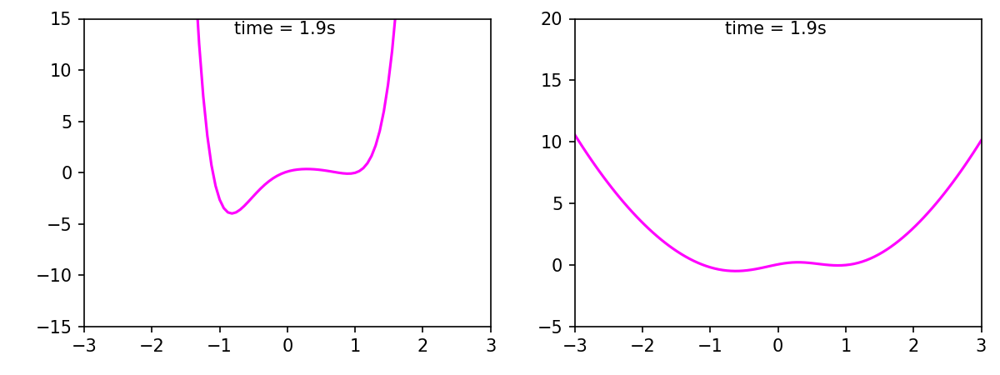

In [73]:
import matplotlib.animation as animation

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,3))

X = np.linspace(-3,3,100)
t_axis = np.linspace(0, 2*np.pi, 100)

xdata1, ydata1 = [], []
xdata2, ydata2 = [], []

myplot1, = ax1.plot([],[],'magenta')
myplot2, = ax2.plot([],[],'magenta')

time_template = 'time = %.1fs'
time_text1 = ax1.text(0.37, 0.95, '', transform=ax1.transAxes)
time_text2 = ax2.text(0.37, 0.95, '', transform=ax2.transAxes)

def init():
#     ax.set_xlabel("x")
#     ax.set_ylabel("$\\rho_T(x)$")
    ax1.set_xlim(-3,3)
    ax1.set_ylim(-15,15)
    ax2.set_xlim(-3,3)
    ax2.set_ylim(-5,20)
#     ax.plot((-1,-1),(0,0.45),color="black",linestyle="--", alpha=0.35)
#     ax.plot(( 1, 1),(0,0.45),color="black",linestyle="--", alpha=0.35)
    return myplot1, myplot2
    
def update(i):
    t0 = t_axis[i]
    # clear previous data
    xdata1, ydata1 = [], []
    xdata2, ydata2 = [], []
    
    # update curve data
    xdata1.append(X)
    ydata1.append([f1(t0,x0) for x0 in X])
    
    xdata2.append(X)
    ydata2.append([f2(t0,x0) for x0 in X])
    
    myplot1.set_data(xdata1, ydata1)
    myplot2.set_data(xdata2, ydata2)
    
    time_text1.set_text(time_template % t0)
    time_text2.set_text(time_template % t0)
    
    return myplot1, time_text1, myplot2, time_text2

anim = animation.FuncAnimation(fig, update, 100, interval=50, init_func=init, blit=True)
# anim.save('animation.gif', writer='imagemagick', fps=50, dpi=200)
fig.tight_layout()
plt.show()

## TEST 2

In [9]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook

In [10]:
x_axis = np.linspace(-3,3,300)
y_axis = np.linspace(-3,3,300)
X, Y = np.meshgrid(x_axis, y_axis)

In [11]:
Z = np.exp(-X**2 - Y**2)

<IPython.core.display.Javascript object>


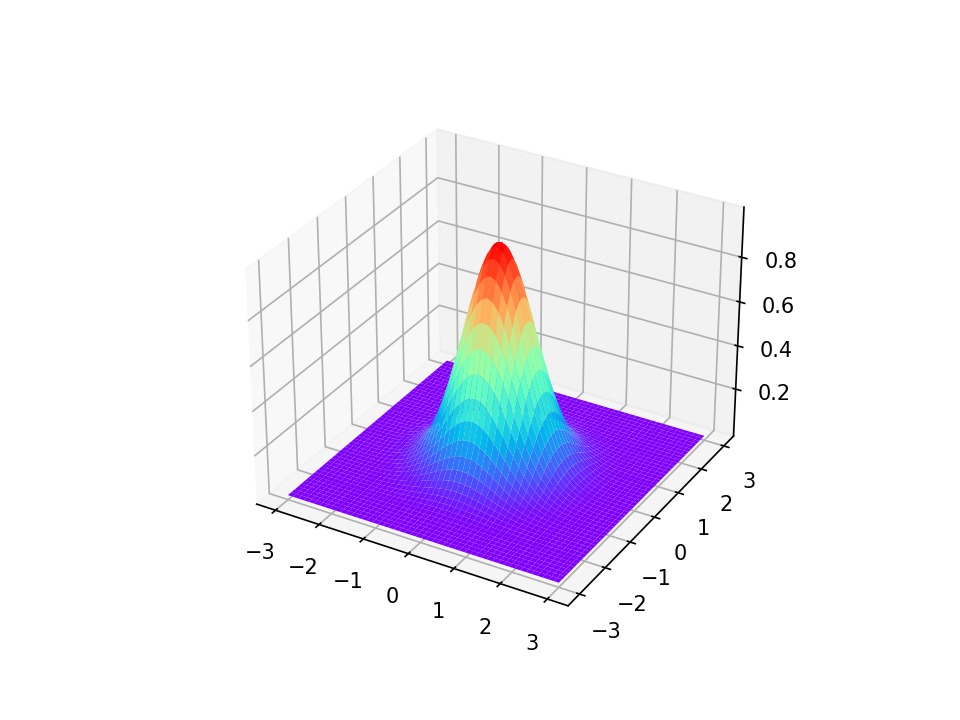

<IPython.core.display.Javascript object>


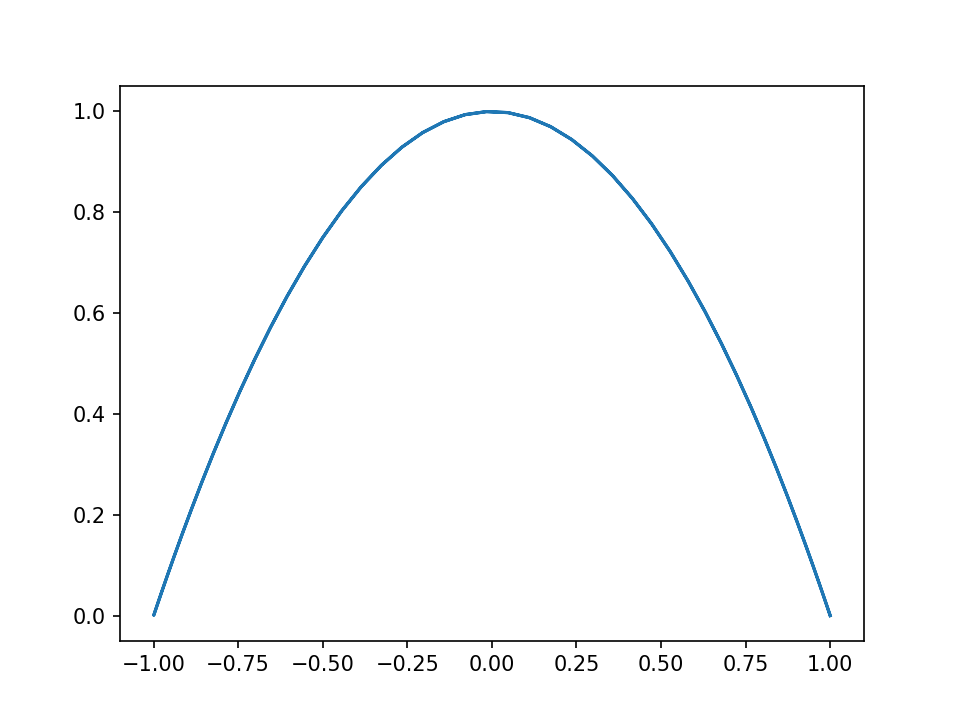

In [16]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"},dpi=100)
surf = ax.plot_surface(X, Y, Z, cmap="rainbow")

fig, ax = plt.subplots(1,1,dpi=100)
# t = np.pi/2
t = np.linspace(0, 2*np.pi, 100)
x = np.cos(t)
y = np.sin(t)**2
# z = 1 + 2*x*np.cos(t) + x**2
ax.plot(x, y)

#ax.set_xlabel("$x$")
#ax.set_ylabel("$y$")
# ax.set_zlabel("$z$")

plt.show()

# Particle ensembles

## Rejection Sampling 

In [1]:
import numpy as np

In [2]:
def randomvariate(pdf,n=1000,xmin=0,xmax=1):
    # Calculates the minimal and maximum values of the PDF in the desired  
    # interval. The rejection method needs these values in order to work  
    # properly.  
    x = np.linspace(xmin, xmax, 1000)    
    pmin = pdf(x).min()
    pmax = pdf(x).max()  

    # Counters  
    naccept=0  
    ntrial=0  

    # Keeps generating numbers until we achieve the desired n  
    ran=[] # output list of random numbers  
    while naccept<n:  
        x=np.random.uniform(xmin, xmax) # x'  
        y=np.random.uniform(pmin, pmax) # y'  

        if y < pdf(x): 
            ran.append(x)
            naccept = naccept + 1
            ntrial = ntrial + 1

    ran = np.asarray(ran)  

    return ran, ntrial

## Sampling ICs ensembles

In [3]:
pdf_x_t  = lambda x, t: (2/(3*np.sqrt(np.pi)))*np.exp(-x**2)*(x**2 + 2*x*np.cos(t) + 1)
pdf_x_t0 = lambda x: pdf_x_t(x, 0)

In [51]:
n_max = 1000
x_min, x_max = (-3,3)
sample, n_trials = randomvariate(pdf_x_t0, n_max, x_min, x_max)

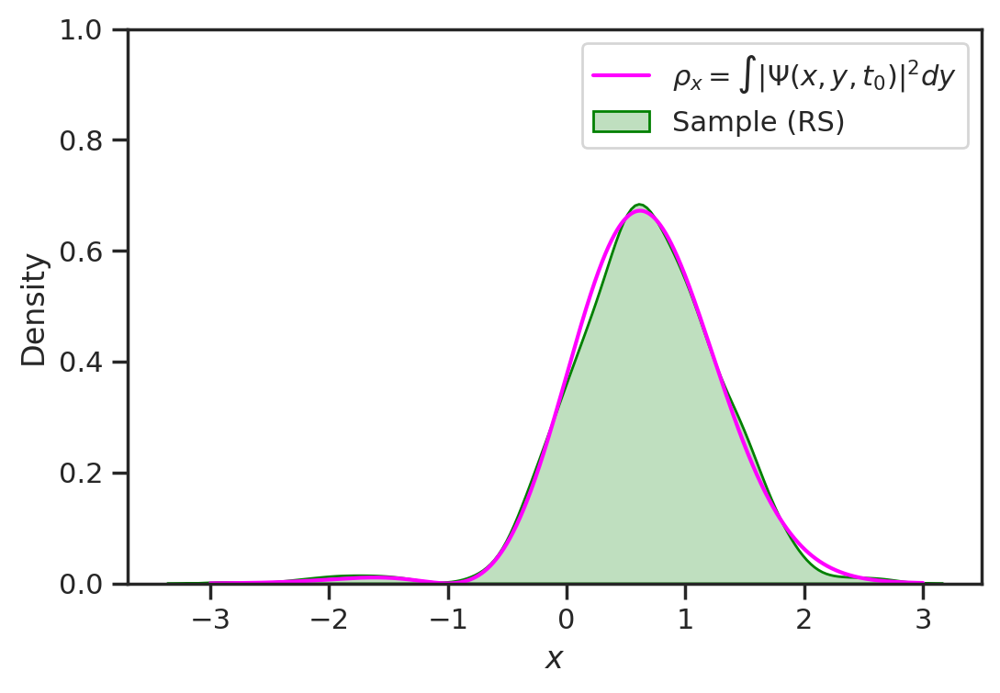

In [52]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

fig,ax = plt.subplots(1,1,dpi=200)

x_axis = np.linspace(x_min, x_max, 1000)
ax.plot(x_axis, pdf_x_t0(x_axis), color="magenta",label="$\\rho_x = \int | \Psi(x, y, t_0) |^2 dy$")

df = pd.DataFrame(sample)
sns.kdeplot(df[0].values, common_norm=True, shade=True, color="green",label="Sample (RS)", ax=ax)

ax.set_xlabel("$x$")
ax.set_ylabel("Density")

ax.set_ylim(0, 1)

ax.legend()
plt.show()

## Temporal evolution of ensemble

Vector field

In [53]:
def f(t, x, a = 1, omega1 = 1):
    f1 = -a*np.sqrt(omega1)*np.sin(omega1*t)
    f2 = 1 + 2*a*np.sqrt(omega1)*x*np.cos(omega1*t) + a**2 * omega1 * x**2
    return f1/f2

Particle traces: configuration space

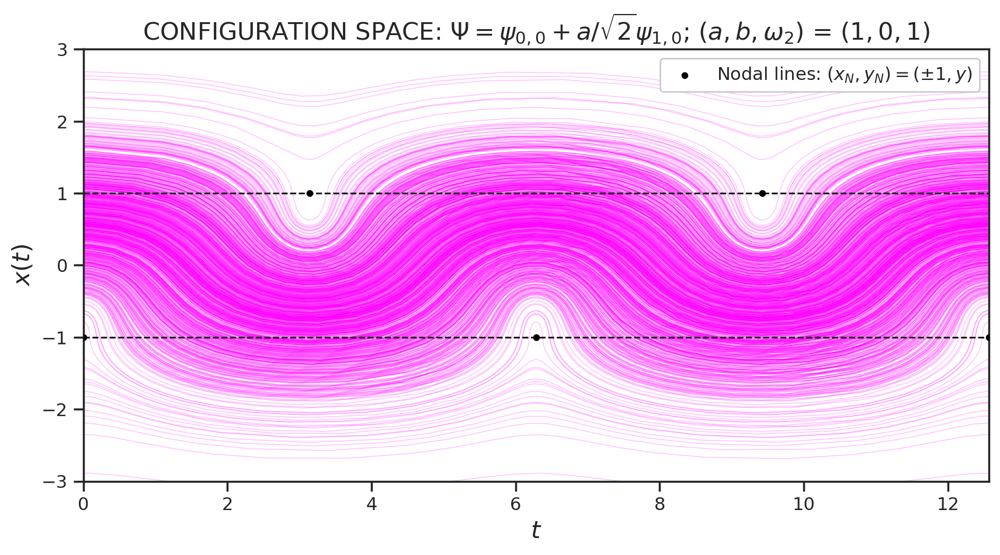

In [54]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

a = 1
#omega1 = 10
omega1 = 1
vector_field = lambda t, x: f(t, x, a, omega1)

t0, tf = [0, 4*np.pi]
time_span = (t0, tf)
color_traj = 'magenta'

TRAJECTORIES = []

ICs = sample
for x0 in sample:
    solution = solve_ivp(vector_field, time_span, [x0], rtol=1.0e-12)
    trajectory = solution.y
    TRAJECTORIES.append([solution.t, trajectory[0]])
    ax.plot(solution.t, trajectory[0], c="magenta", lw=0.5, alpha=0.25)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$x(t)$", fontsize=15)


for k in range(5):
    ax.scatter(k*np.pi, a*(-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.set_xlim(0, 4*np.pi)
ax.set_ylim(-3, 3)
title = "CONFIGURATION SPACE: $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title, fontsize=15)

ax.plot(time_span, (a,a), lw=1,linestyle="--", color="black")
ax.plot(time_span, (-a*1,-a*1), lw=1,linestyle="--", color="black")

label = "Nodal lines: $(x_N, y_N) = (\pm 1, y)$"
ax.scatter([],[],color="black", s=10, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
ax.set_aspect(1)
plt.show()

Particle traces: phase space

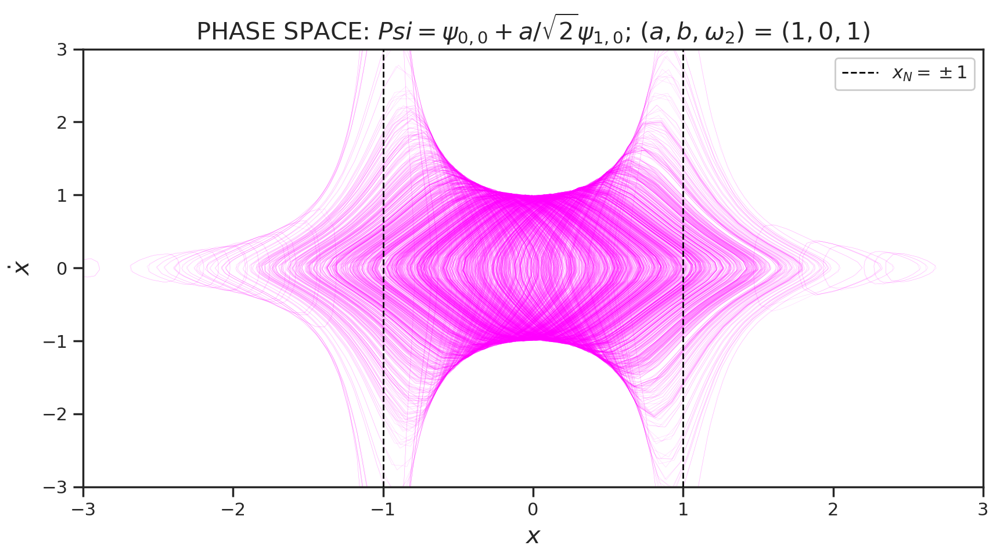

In [55]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
# colors = pl.cm.rainbow(np.linspace(0,1,len(TRAJECTORIES_subset)))

# alphas = np.linspace(0,1,len(TRAJECTORIES))

for i in range(len(TRAJECTORIES)):
    trajectory = TRAJECTORIES[i]
    plt.plot(trajectory[-1], f(*trajectory), c="magenta", lw=0.15, alpha=0.25)
    
#axis labels
ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$\dot{x}$", fontsize=15)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

title = "PHASE SPACE: $Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($1, 0, 1$)"
ax.set_title(title, fontsize=15)

ax.plot((-1,-1), (-3, 3), lw=1,linestyle="--", color="black", zorder=10)
ax.plot(( 1, 1), (-3, 3), lw=1,linestyle="--", color="black", zorder=10)

label = "$x_N = \pm 1$"
ax.plot([], [], color="black", linestyle="--", lw=1, label=label)

ax.legend(loc="upper right", facecolor="white", framealpha=1)
plt.show()

Vector field

In [56]:
def f(t, x, a = 1, omega1 = 1):
    f1 = -a*np.sqrt(omega1)*np.sin(omega1*t)
    f2 = 1 + 2*a*np.sqrt(omega1)*x*np.cos(omega1*t) + a**2 * omega1 * x**2
    return f1/f2

Particle traces: configuration space

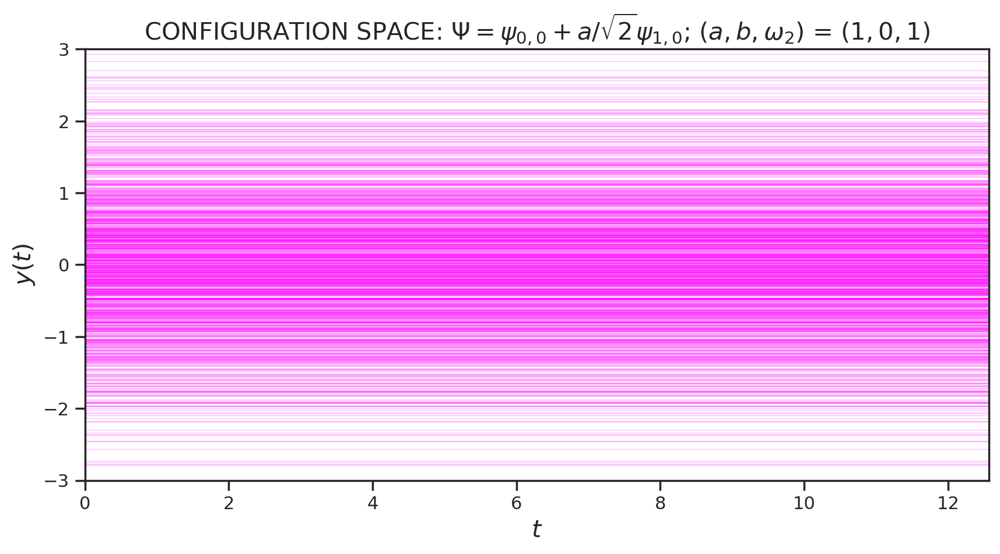

In [57]:
fig,ax = plt.subplots(1,1,figsize=(10,5),dpi=200)

n_levels = 200
cmap = "rainbow"

t0, tf = [0, 4*np.pi]
time_span = (t0, tf)
dt = 0.1
color_traj = 'magenta'

TRAJECTORIES = []

ICs_y = np.random.randn(len(sample))

for y0 in ICs_y:
    solution_t = np.linspace(*time_span, int((tf-t0)/dt))
    solution_y = y0*np.ones(int((tf-t0)/dt))
    TRAJECTORIES.append([solution_t, solution_y])
    ax.plot(solution_t, solution_y, c="magenta", lw=0.5, alpha=0.25)
    
#axis labels
ax.set_xlabel("$t$", fontsize=15)
ax.set_ylabel("$y(t)$", fontsize=15)


# for k in range(5):
#     ax.scatter(k*np.pi, a*(-1)**(k+1), color="black", s=10, zorder=10, alpha=1)

ax.set_xlim(0, 4*np.pi)
ax.set_ylim(-3, 3)
title = "CONFIGURATION SPACE: $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title, fontsize=15)

# ax.plot(time_span, (a,a), lw=1,linestyle="--", color="black")
# ax.plot(time_span, (-a*1,-a*1), lw=1,linestyle="--", color="black")

# label = "Nodal lines: $(x_N, y_N) = (\pm 1, y)$"
# ax.scatter([],[],color="black", s=10, label=label)

# ax.legend(loc="upper right", facecolor="white", framealpha=1)
ax.set_aspect(1)
plt.show()

## Poincare recurrence map 

In [58]:
a, b, omega2, t0 = (1, 0, 1, 0)
vector_field = lambda t, u: Bohmian_velocity_field(t, u, PARAMETERS=[a, b, omega2, t0])

def f(t, u_flat):
    u = u_flat.reshape(-1,2)
    return vector_field(t, u).ravel()

In [59]:
n_trials = 10
t0, tf = (0, np.pi)
time_span = (t0, tf)
    
data_points = []
for i in range(n_trials):
    ICs_y = np.random.randn(len(sample))
    ICs_xy = np.column_stack([ICs, ICs_y])
    solution = solve_ivp(f, time_span, ICs_xy.ravel(), t_eval=[tf], rtol=1.0e-12)
    trajectory = solution.y
    data_points.append(trajectory)
    
import itertools

data_points = list(itertools.chain.from_iterable(data_points))
points = np.array(data_points).reshape(-1).reshape(-1,2)

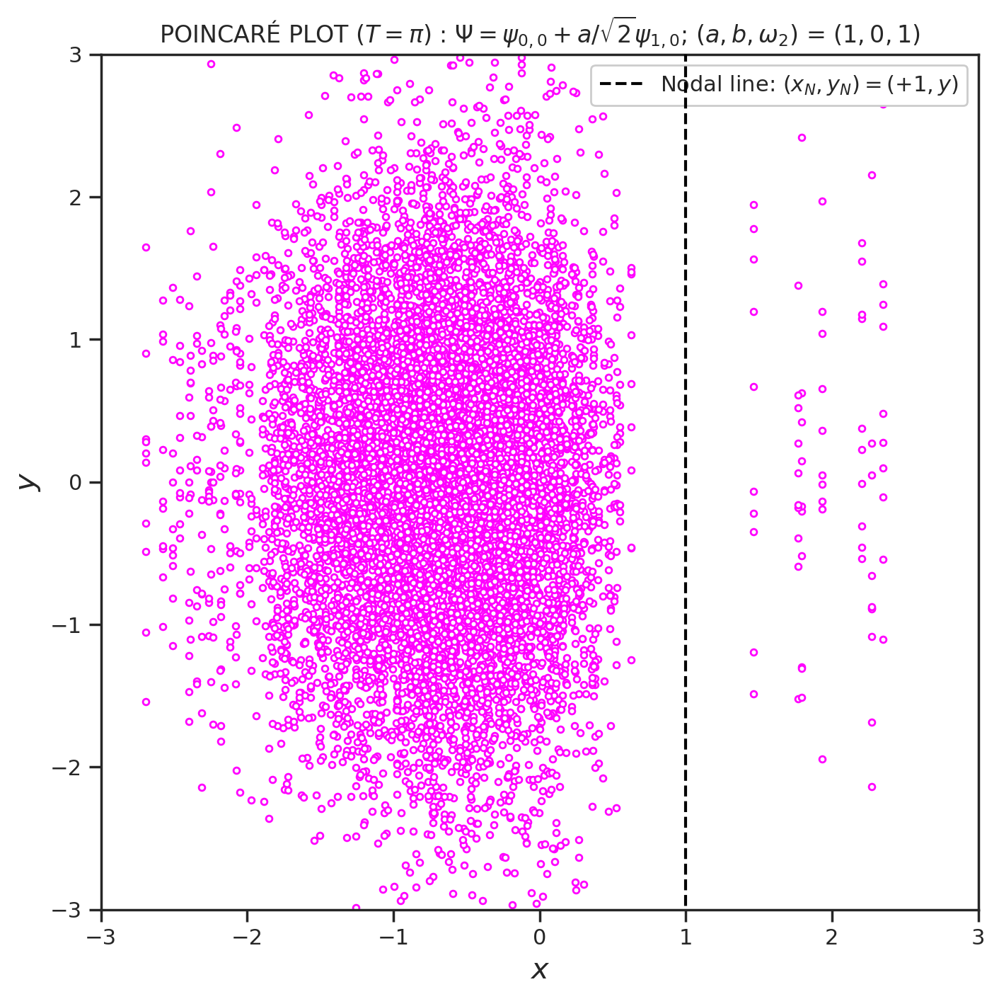

In [60]:
fig, ax = plt.subplots(1,1,figsize=(8,8),dpi=200)

# poincare map points
ax.scatter(*points.T, color="white", marker="o", s=10, alpha=1, edgecolor="magenta")

mylabel = "Nodal line: $(x_N, y_N) = (+1, y)$"
ax.plot((1,1),(-6,6), color="black", label=mylabel, linestyle="--", zorder=10)

title = "POINCARÉ PLOT ($T = \pi$) : $\Psi = \psi_{0,0} + a/ \sqrt{2} \psi_{1,0}$; ($a, b, \omega_2$) = ($"+str(a)+", 0, 1$)"
ax.set_title(title)

ax.set_xlabel("$x$", fontsize=15)
ax.set_ylabel("$y$", fontsize=15)

ax.set_xlim(-3,3)
ax.set_ylim(-3,3)

ax.legend(loc="upper right", facecolor="white", framealpha=1)

plt.show()

<AxesSubplot:xlabel='x', ylabel='y'>

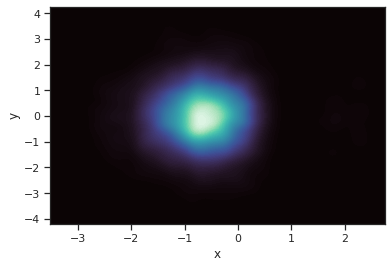

In [61]:
df = pd.DataFrame(points, columns=["x", "y"])

sns.kdeplot(data=df, x="x", y="y", fill=True, thresh=0, levels=100, cmap="mako")

In [62]:
df = pd.DataFrame(points, columns=["x", "y"])

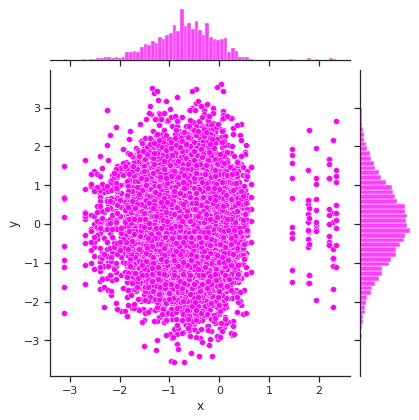

In [63]:
sns.set_theme(style="ticks")

g = sns.jointplot(
    data=df,
    x="x", 
    y="y",
    color="magenta"
)